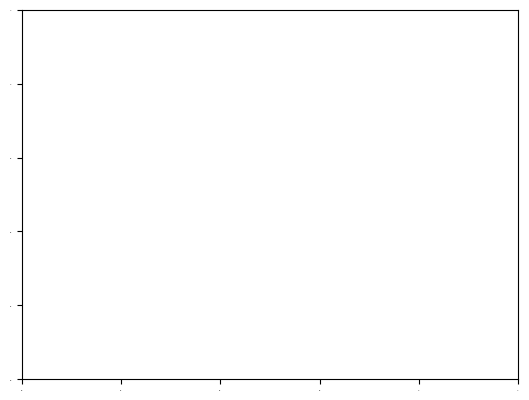

In [2]:
import os
import pandas as pd
import numpy as np
from PIL import Image
import seaborn as sns
import matplotlib.pyplot as plt
import rasterio
from rasterio.plot import show
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib_scalebar.scalebar import ScaleBar
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
from pathlib import Path
from matplotlib.ticker import ScalarFormatter
from os.path import join
from shapely.geometry import box
import warnings
from shapely.ops import unary_union
from matplotlib.lines import Line2D

fontsize = 14
# plt.rcParams['font.family'] = 'serif'
plt.rcParams['xtick.labelsize'] = fontsize - 3
plt.rcParams['ytick.labelsize'] = fontsize - 3
plt.rcParams['font.size'] = fontsize
plt.rcParams['legend.fontsize'] = fontsize
plt.tick_params(axis='both', labelsize=1)

In [3]:
manual_label_dir = "/net/data_ssd/tree_mortality_orthophotos/labels_and_aois/"
orthophoto_dir = "/net/data_ssd/tree_mortality_orthophotos/orthophotos/"
prediction_label_dir = "/net/data_ssd/tree_mortality_orthophotos/deadwood_segmentation_predictions_104//"

BoundingBox(left=12.29364754940055, bottom=51.3643753256927, right=12.31170405674576, top=51.3765363186545)
TP_area=1.0992887323851785e-07, FP_area=2.185021905590042e-08, FN_area=1.613915434419206e-09
basename='auwald_flight_all_merge_ortho', precision=0.8341905481706986, recall=0.9855309746724059, f1=0.9035675114912184
BoundingBox(left=-74.00792801392979, bottom=45.985978470562074, right=-73.9977068204589, top=45.99327236747261)
TP_area=6.307724183579686e-09, FP_area=5.0537067805219845e-09, FN_area=1.5876818085453287e-09
basename='quebec_2021-07-21-sbl-cloutier-z1-rgb', precision=0.5551874762527703, recall=0.79891068171429, f1=0.6551152920822843
BoundingBox(left=-74.00779992410739, bottom=45.990529354410164, right=-73.99837398088175, top=45.99606377480495)
TP_area=6.55780261150865e-10, FP_area=3.392718094074383e-09, FN_area=3.4387482471391494e-11
basename='quebec_2021-06-17-sbl-cloutier-z2-rgb', precision=0.16198111092338063, recall=0.9501751816291599, f1=0.27677842138333314
BoundingB

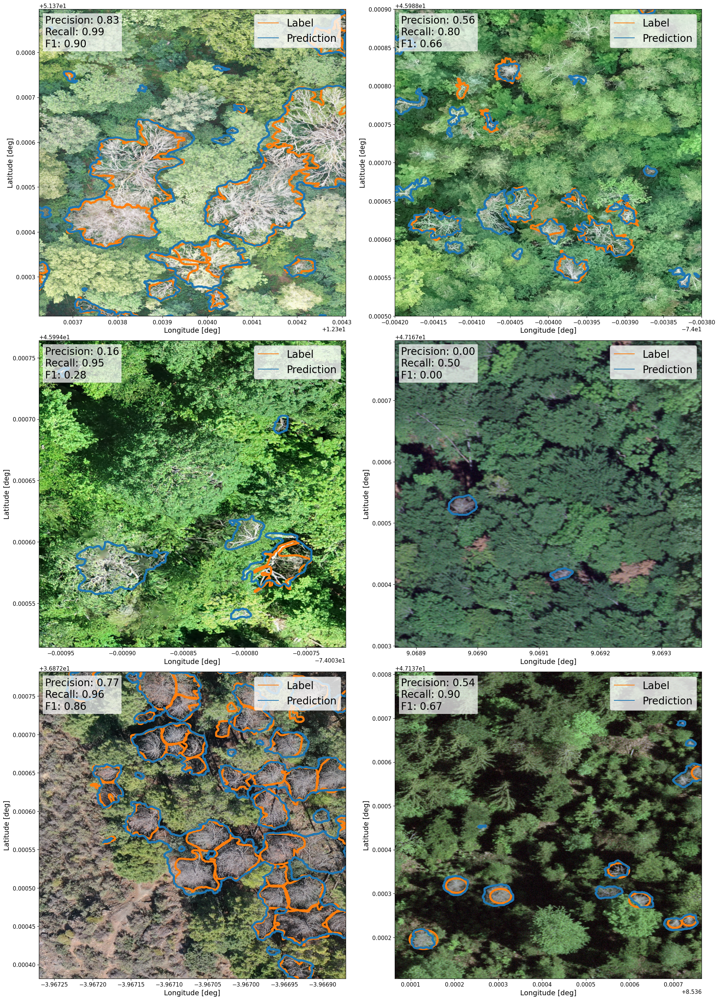

In [4]:
orthophoto_base_names = ["auwald_flight_all_merge_ortho", "quebec_2021-07-21-sbl-cloutier-z1-rgb", "quebec_2021-06-17-sbl-cloutier-z2-rgb",
                        "switzerlandeth_rgb11", "spain_20_09_2023_south_tejeda_1_ortho", "switzerlandeth_rgb9", ]
bls = [(51.37021264, 12.30362458), (45.9885, -74.0042), (45.99451412, -74.00396778), (47.1672977, 9.0688653), (36.87238192, -3.96727006), (47.13710621, 8.53606414), ] 
extents = [0.00068366, 0.0004, 0.00025, 0.0005, 0.0004, 0.0007]

# "uavforsat_FIN003_ortho" (60.223928052, 24.910386108), 0.0005
# "uavforsat_FIN003_ortho", (60.2232, 24.914030093), 0.00068366,

fig, axes = plt.subplots(ncols=2, nrows=3 ,figsize=(20,30))

for basename, bl, extent, ax in zip(orthophoto_base_names, bls, extents, axes.flatten()):
    label_path = join(manual_label_dir, basename + "_polygons.gpkg")
    orthophoto_path = join(orthophoto_dir, basename + ".tif")
    prediction_path = join(prediction_label_dir, basename + "_prediction.gpkg")
    
    dr = rasterio.open(orthophoto_path)

    print(dr.bounds)

    label = gpd.read_file(label_path, layer="standing_deadwood")
    try:
        label = pd.concat([label, gpd.read_file(label_path, layer="brown_trees")])
    except:
        pass
    try:
        label = pd.concat([label, gpd.read_file(label_path, layer="parts")])
    except:
        pass
        
    label = label.to_crs(dr.crs).buffer(0)
    prediction = gpd.read_file(prediction_path).to_crs(dr.crs).buffer(0)

    bounds_box = box(bl[1], bl[0], bl[1] + extent, bl[0] + extent)

    with warnings.catch_warnings():
        warnings.simplefilter("ignore")
        # crop label and prediction to extend of image and unionize 
        label_union = label.union_all().intersection(bounds_box) 
        pred_union = prediction.union_all().intersection(bounds_box)
        TP_area = label_union.intersection(pred_union).area + 1e-100
        FP_area = pred_union.difference(label_union).area + 1e-100
        FN_area = label_union.difference(pred_union).area + 1e-100
        
    print(f"{TP_area=}, {FP_area=}, {FN_area=}")
    
    precision = TP_area / (TP_area + FP_area)
    recall = TP_area / (TP_area + FN_area)
    f1 = 2 * (precision * recall) / (precision + recall)

    print(f"{basename=}, {precision=}, {recall=}, {f1=}")

    ax.set_ylim((bl[0], bl[0] + extent))
    ax.set_xlim((bl[1], bl[1] + extent))
    win = dr.window(bl[1], bl[0], bl[1] + extent, bl[0] + extent) 
    ax.imshow(np.moveaxis(dr.read(window=win), 0, -1), extent=[bl[1], bl[1] + extent, bl[0], bl[0] + extent], vmin=0, vmax=255)
    
    label.boundary.plot(ax=ax, color="#ff7f0e", lw=4, alpha=1)
    prediction.boundary.plot(ax=ax, color="#1f77b4", lw=4, alpha=1)

    legend_elements = [Line2D([0], [0], color="#ff7f0e", label='Label'),
                     Line2D([0], [0], color="#1f77b4", label='Prediction')]
    ax.legend(handles=legend_elements, fontsize=20)

    ax.set_aspect("equal")
    ax.set_ylabel("Latitude [deg]")
    ax.set_xlabel("Longitude [deg]")

    stats_text = f'Precision: {precision:.2f}\nRecall: {recall:.2f}\nF1: {f1:.2f}'
    ax.text(bl[1] + 0.02*extent, bl[0] + 0.98*extent, stats_text, 
           bbox=dict(facecolor='white', alpha=0.7, edgecolor="white"),
           verticalalignment='top', fontsize=20)

fig.subplots_adjust(hspace=-0.4, wspace=0.1)
fig.tight_layout()
fig.savefig("/net/home/cmosig/projects/standing-deadwood/plots/discussion_plot_examples.pdf")